In [1]:
%load_ext autoreload
%autoreload 2

# Introdução
* Carregar imagens e apresentar o histograma.
* Clarear e escurecer as imagens com dois valores de gamma
* Binarizar as imagens originais e transformadas
* Apresentar as imagens com os bits mais e menos significativos
* Apresentar as métricas objetivas

# Carregamento das bibliotecas.

In [2]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
import glob
from skimage.metrics import structural_similarity
from skimage.metrics import peak_signal_noise_ratio

# Funçoes utilitárias 

In [3]:
def read_and_plot(img_path):
    img = cv2.imread(img_path)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) 
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    
    fig = plt.figure(figsize=(17,12))
    
    ax = fig.add_subplot(2, 2, 1)
    plt.axis('off')
    plt.imshow(img_rgb)
    ax.set_title(img_path.split(os.path.sep)[-1])
    ax = fig.add_subplot(2,2,2)
    #plt.axis('off')
    plt.xticks(np.arange(0, 257, step=16))
    plt.hist(img_rgb.ravel(), bins=16)
    ax.set_title(f'Histograma de {img_path.split(os.path.sep)[-1]}')
    
    ax = fig.add_subplot(2, 2, 3)
    plt.axis('off')
    plt.imshow(img_gray, cmap='gray')
    ax.set_title(img_path.split(os.path.sep)[-1])
    
    ax = fig.add_subplot(2, 2, 4)
    #plt.axis('off')
    plt.xticks(np.arange(0, 257, step=16))
    plt.hist(img_gray.ravel(), bins=16)
    ax.set_title(f'Histograma em escala de cinza de {img_path.split(os.path.sep)[-1]}')
    
    return img_rgb, img_gray

In [4]:
def gammaCorrection(src, gamma):
    
    invGamma = 1 / gamma
    table = [((i / 255) ** invGamma) * 255 for i in range(256)]
    table = np.array(table, np.uint8)

    return cv2.LUT(src, table)

In [5]:
def corrigir_gamma_plot(img_path, gamma):
    img = cv2.imread(img_path)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) 
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_gray_gamma = gammaCorrection(img_gray, gamma)
    img_rgb_gamma = gammaCorrection(img_rgb, gamma)
    
    fig = plt.figure(figsize=(20,10))
    
    ax = fig.add_subplot(2, 3, 1)
    plt.axis('off')
    plt.imshow(img_rgb)
    ax.set_title(img_path.split(os.path.sep)[-1])
    
    ax = fig.add_subplot(2,3,2)
    plt.axis('off')
    plt.imshow(img_rgb_gamma)
    ax.set_title('gamma')
    
    ax = fig.add_subplot(2,3,3)
    plt.xticks(np.arange(0, 257, step=16))
    plt.hist(img_rgb_gamma.ravel(), bins=16)
    ax.set_title(f'Histograma de {img_path.split(os.path.sep)[-1]} com gamma')
    
    ax = fig.add_subplot(2, 3, 4)
    plt.axis('off')
    plt.imshow(img_gray, cmap='gray')
    ax.set_title(img_path.split(os.path.sep)[-1])
    
    ax = fig.add_subplot(2, 3, 5)
    plt.axis('off')
    plt.imshow(img_gray_gamma, cmap='gray')
    ax.set_title(img_path.split(os.path.sep)[-1])
    
    ax = fig.add_subplot(2, 3, 6)
    plt.xticks(np.arange(0, 257, step=16))
    plt.hist(img_gray_gamma.ravel(), bins=16)
    ax.set_title(f'Histograma de {img_path.split(os.path.sep)[-1]} com gamma' )
    
    return img_rgb_gamma, img_gray_gamma
    

In [6]:
def otsu(img_gray, img_gamma_gray):
    limiar_gray , img_otsu = cv2.threshold(img_gray,0,255,cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    limiar_gamma , img_otsu_gamma = cv2.threshold(img_gamma_gray,0,255,cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    fig = plt.figure(figsize=(17,7))
    
    ax = fig.add_subplot(1, 2, 1)
    plt.axis('off')
    plt.imshow(img_otsu, cmap='gray')
    ax.set_title(f'Original Otsu, limiar: {limiar_gray}')
    
    ax = fig.add_subplot(1, 2, 2)
    plt.axis('off')
    plt.imshow(img_otsu_gamma, cmap='gray')
    ax.set_title(f'Otsu Gamma: {limiar_gamma}')

In [7]:
def split_img_bits(img_path):
    img = cv2.imread(img_path, 0)
    lst = []
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
             lst.append(np.binary_repr(img[i][j] ,width=8)) # width = no. of bits

    # Cada bit corresponde a um plano

    bit_8 = (np.array([int(i[0]) for i in lst],dtype = np.uint8) * 128).reshape(img.shape[0],img.shape[1])
    bit_7 = (np.array([int(i[1]) for i in lst],dtype = np.uint8) * 64).reshape(img.shape[0],img.shape[1])
    bit_6 = (np.array([int(i[2]) for i in lst],dtype = np.uint8) * 32).reshape(img.shape[0],img.shape[1])
    bit_5 = (np.array([int(i[3]) for i in lst],dtype = np.uint8) * 16).reshape(img.shape[0],img.shape[1])
    bit_4 = (np.array([int(i[4]) for i in lst],dtype = np.uint8) * 8).reshape(img.shape[0],img.shape[1])
    bit_3 = (np.array([int(i[5]) for i in lst],dtype = np.uint8) * 4).reshape(img.shape[0],img.shape[1])
    bit_2 = (np.array([int(i[6]) for i in lst],dtype = np.uint8) * 2).reshape(img.shape[0],img.shape[1])
    bit_1 = (np.array([int(i[7]) for i in lst],dtype = np.uint8) * 1).reshape(img.shape[0],img.shape[1])
    list_imgs_split = [bit_1, bit_2, bit_3, bit_4, bit_5, bit_6, bit_7, bit_8]

    plt.figure(figsize=(50,70))
    for ind, img in enumerate(list_imgs_split):
        plt.subplot(4,2 , ind+1)
        plt.axis('off')
        plt.title(f'{img_path.split(os.path.sep)[-1]} - bit {ind}', fontsize=60)
        plt.imshow(img, cmap='gray')
    plt.show()

    return bit_1, bit_2, bit_3, bit_4, bit_5, bit_6, bit_7, bit_8

In [8]:
def comparar_imgs(img_01, img_02):
    img_01 = img_01
    img_grande = img_02
    plt.figure(figsize=(17,12))
    plt.subplot(1, 2, 1)
    plt.axis('off')
    plt.imshow(img_01, cmap='gray')
    plt.subplot(1, 2, 2)
    plt.axis('off')
    plt.imshow(img_02, cmap='gray')
    plt.show()
       
    (score2) = peak_signal_noise_ratio(img_01, img_02)
    print('PSNR',score2)
    
    print('')
    (score,a) = structural_similarity(img_01, img_02, full=True)
    print("SSIM",score)

# Carregar lista das imagens.

In [9]:
imgs_list = glob.glob('../imgs_pdi/*')

In [10]:
imgs_list

['../imgs_pdi/pelagem.jpg',
 '../imgs_pdi/paisagem.jpg',
 '../imgs_pdi/pedestres02.jpg',
 '../imgs_pdi/pre-historia01.jpeg',
 '../imgs_pdi/leao.jpeg',
 '../imgs_pdi/pre-historia02.jpeg']

# Carregar imagens originais e em escala de cinza e exibir histograma.

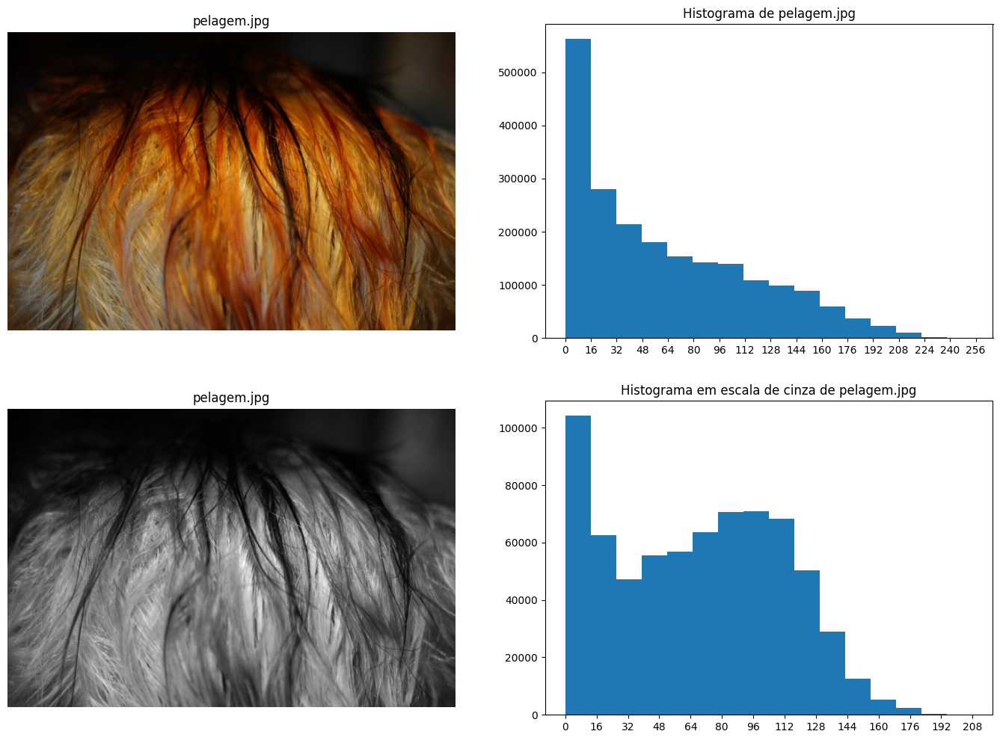

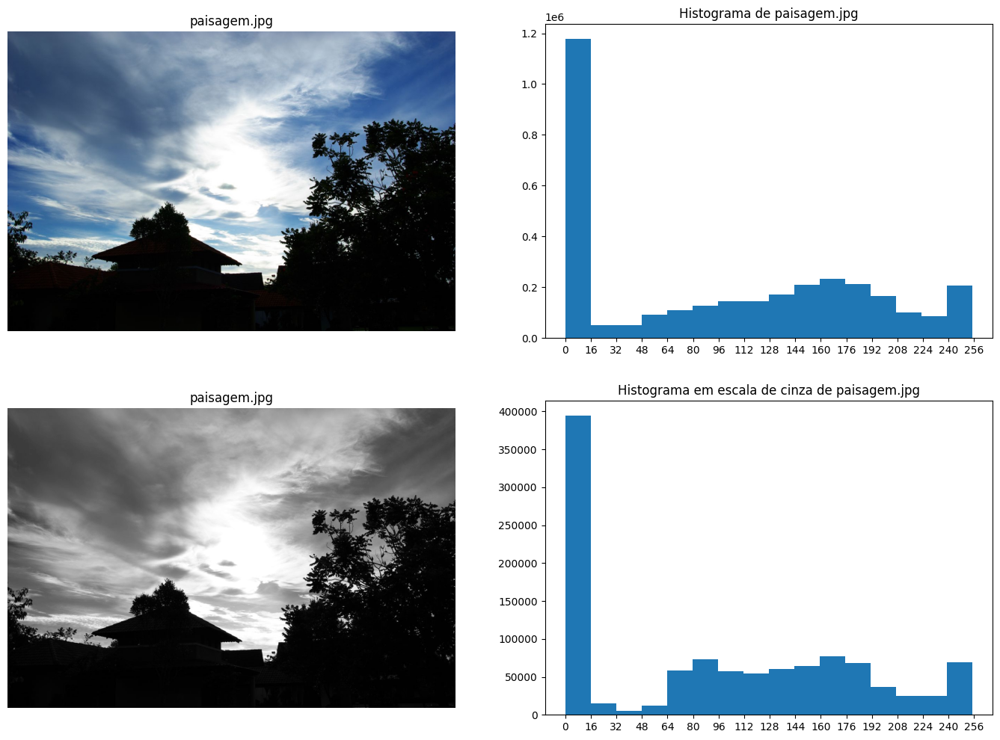

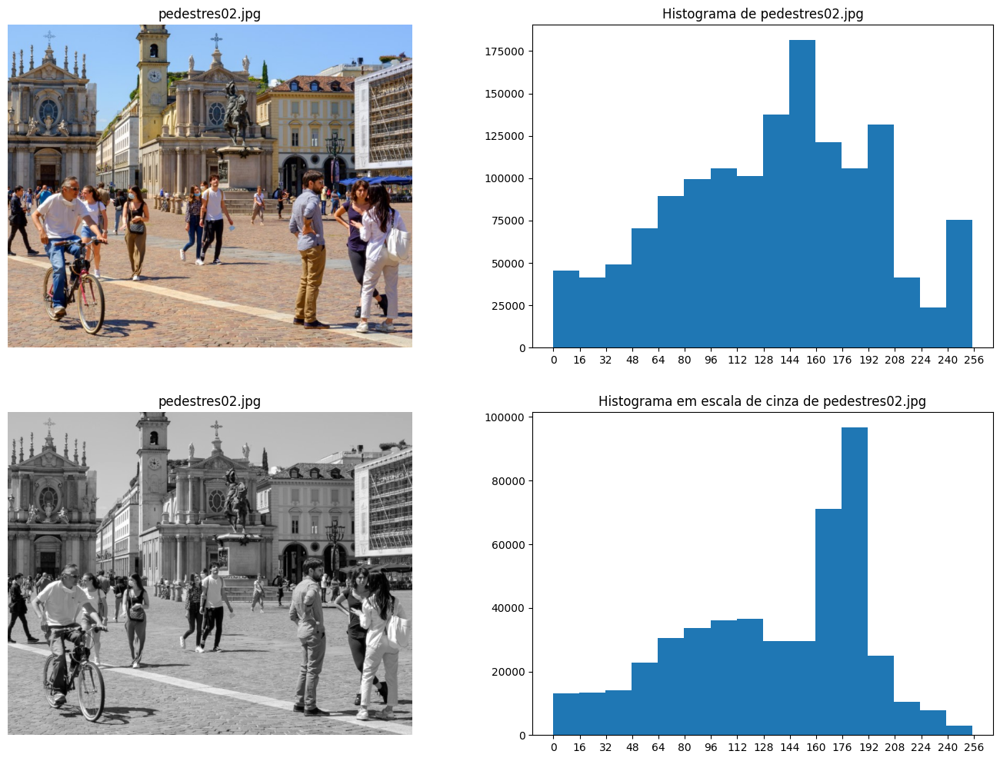

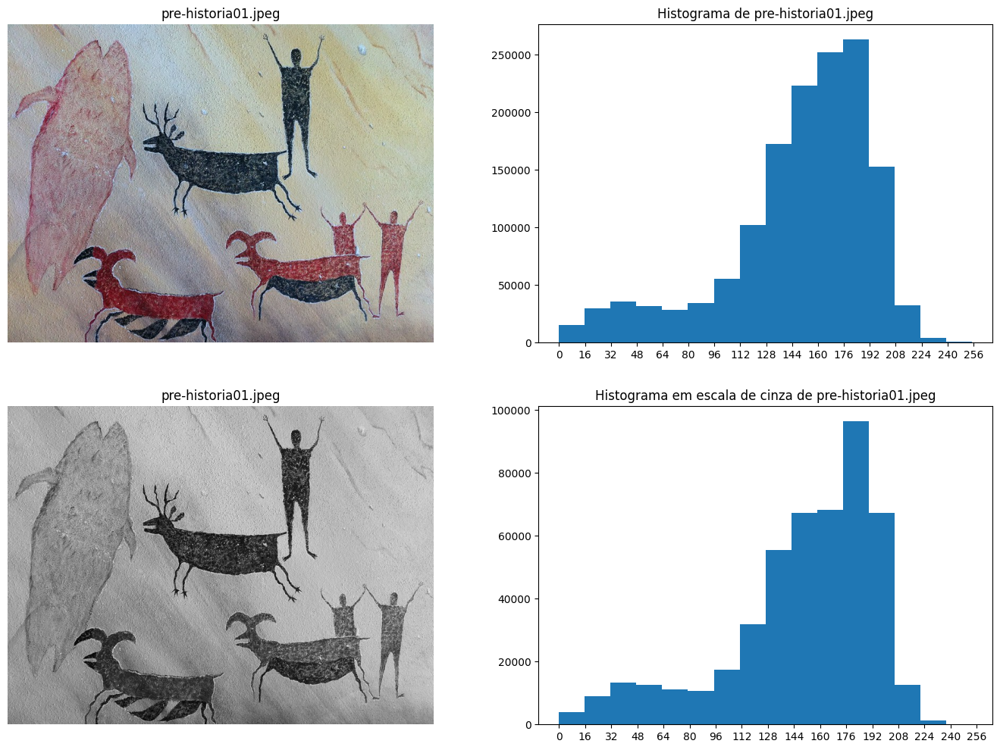

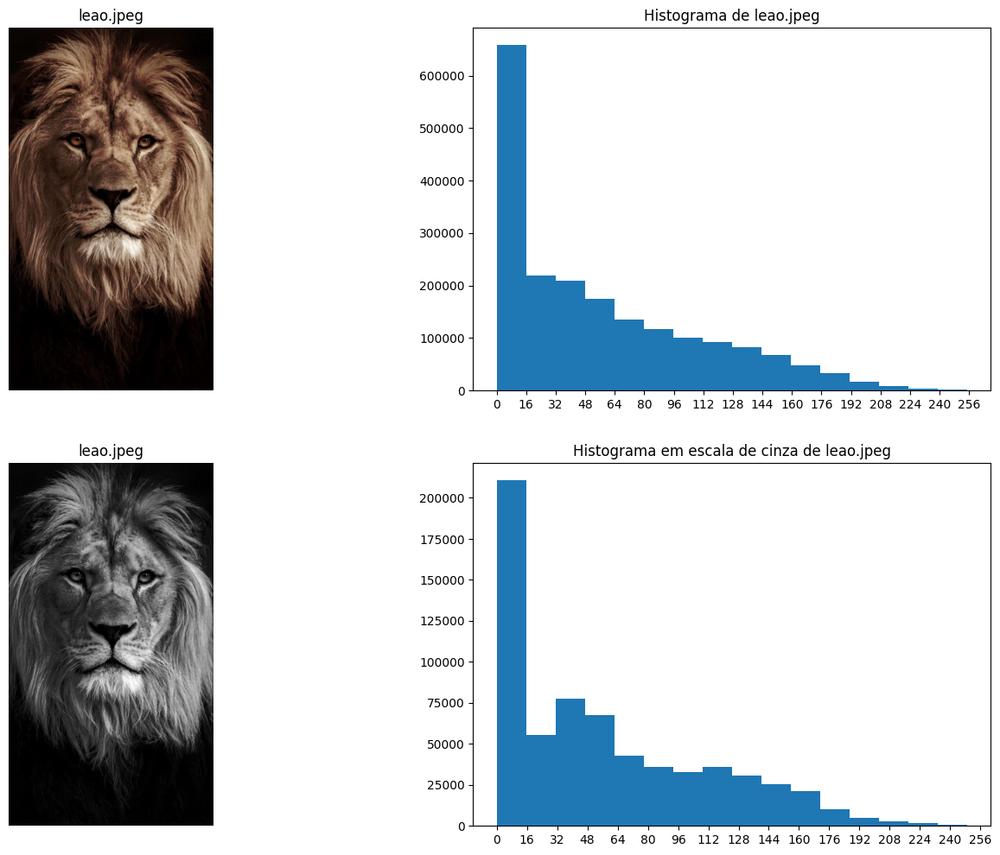

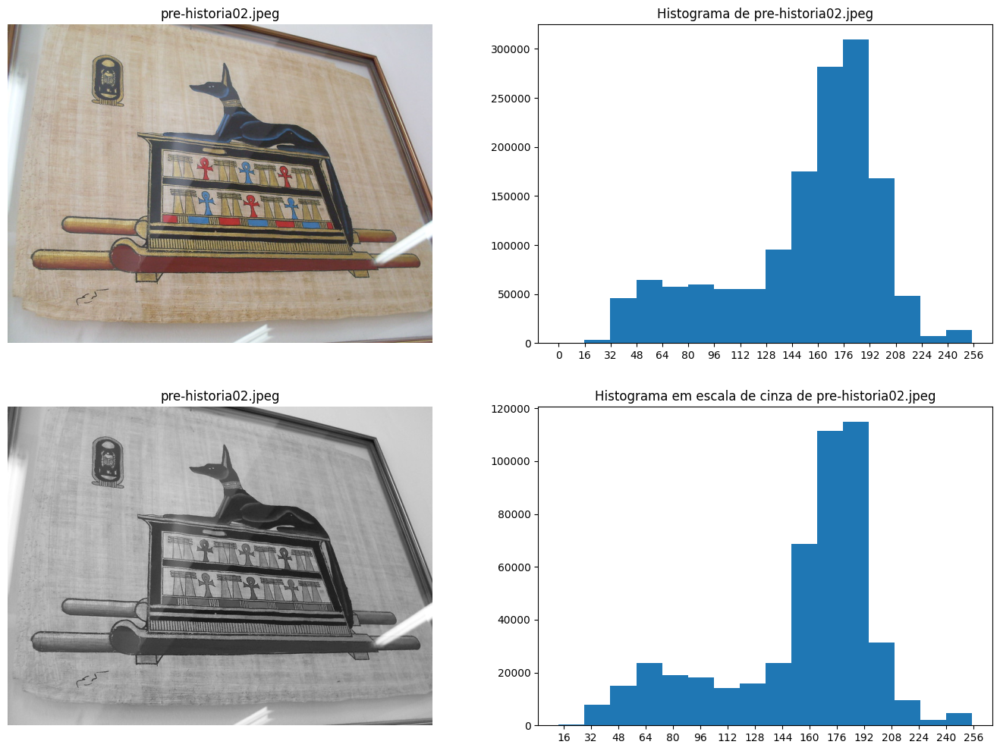

In [11]:
imgs_list_numpy = []
for imgs in imgs_list:
    imgs_list_numpy.append(read_and_plot(imgs))

## Conclusão:
*

* aqui

# Correção de Gamma

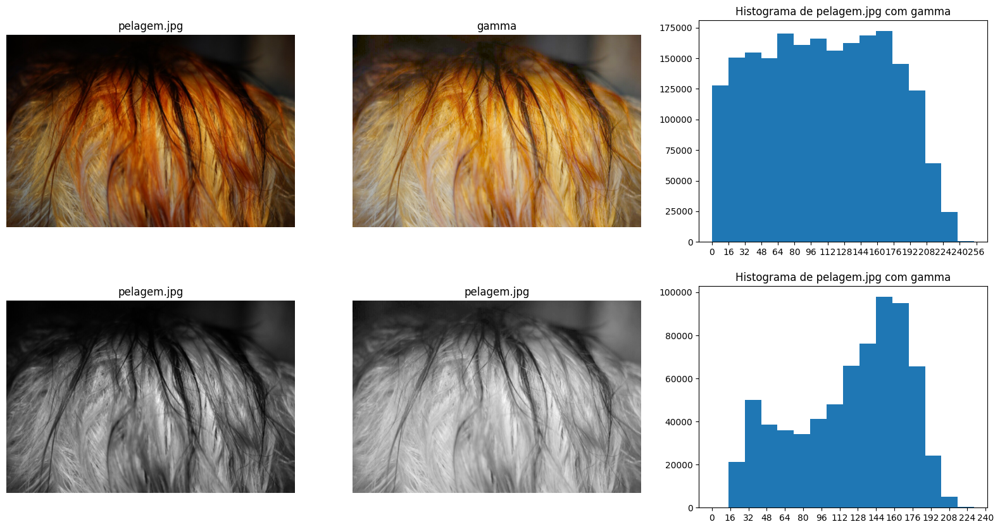

In [12]:
img_gamma_pela, img_gamma_gray_pela = corrigir_gamma_plot(imgs_list[0], 2)

## Conclusão:
*

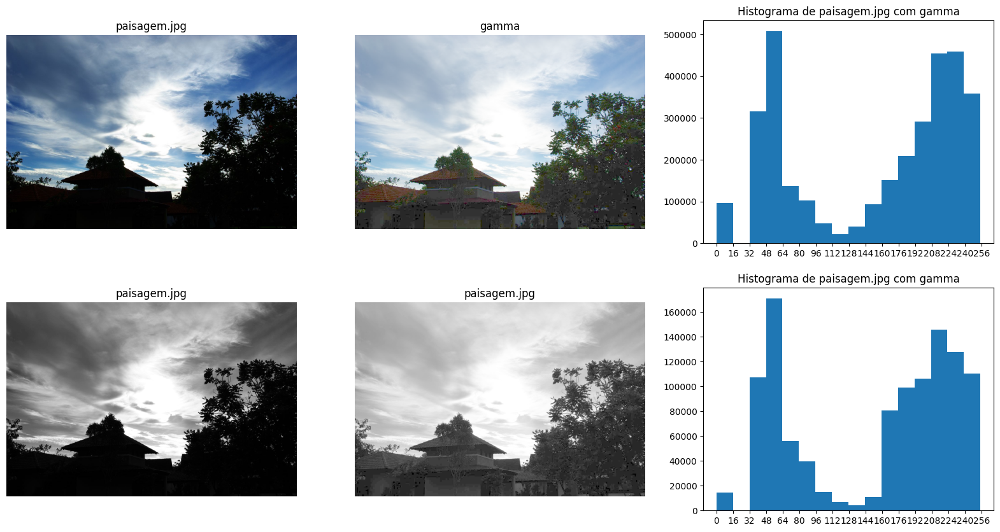

In [13]:
img_gamma_pai, img_gamma_gray_pai = corrigir_gamma_plot(imgs_list[1], 3)

## Conclusão:
*

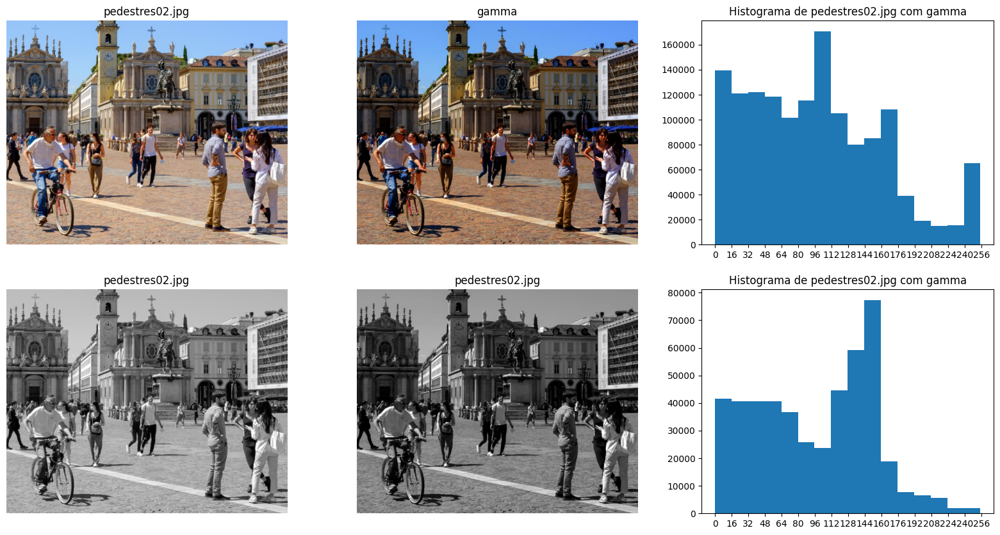

In [14]:
img_gamma_ped02, img_gamma_gray_ped02 = corrigir_gamma_plot(imgs_list[2], 0.6)

## Conclusão:
*

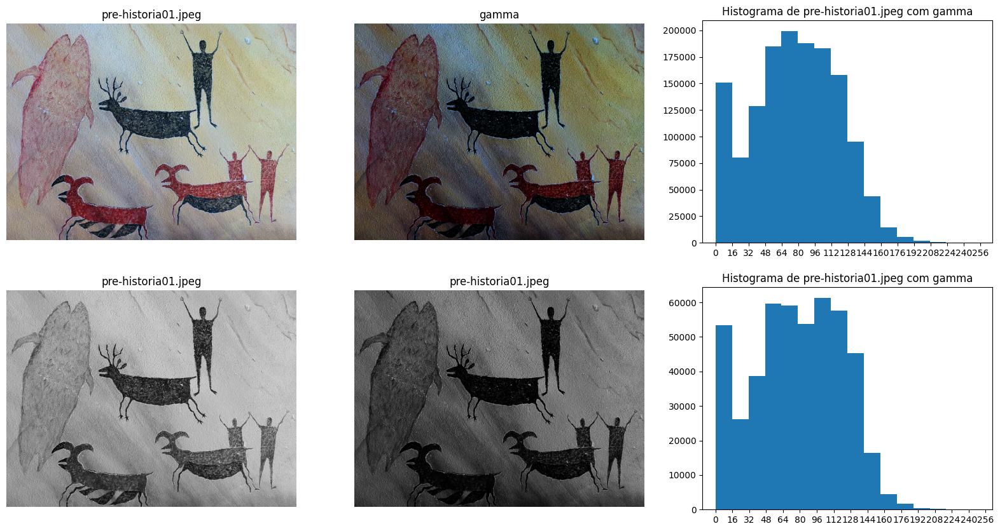

In [15]:
img_gamma_pre01, img_gamma_gray_pre01 = corrigir_gamma_plot(imgs_list[3], 0.4)

## Conclusão:
*

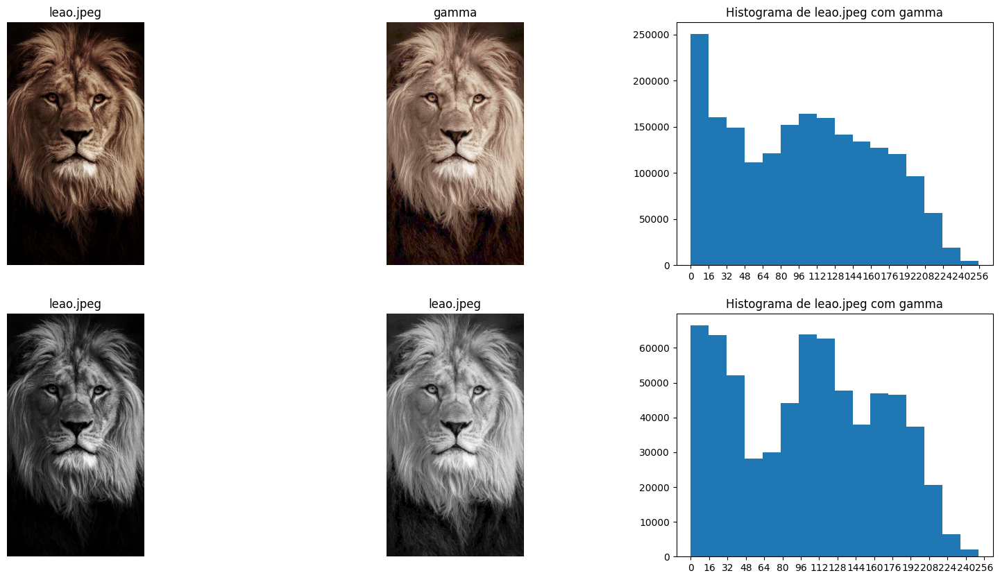

In [16]:
img_gamma_leao, img_gamma_gray_leao = corrigir_gamma_plot(imgs_list[4], 2)

## Conclusão:
*

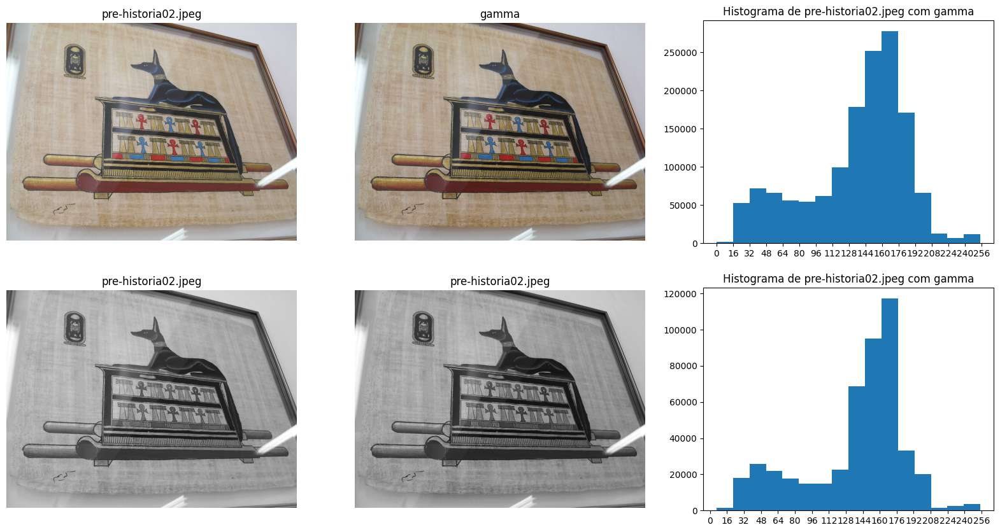

In [17]:
img_gamma_pre02, img_gamma_gray_pre02 = corrigir_gamma_plot(imgs_list[5], 0.8)

## Conclusão:
*

# Método de OTSU 

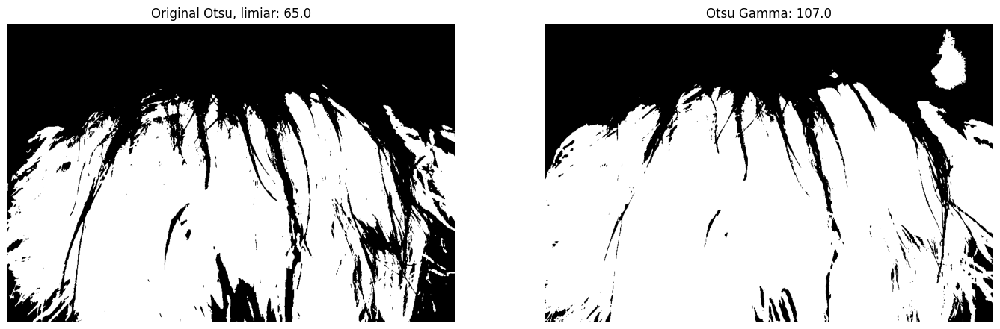

In [18]:
otsu(imgs_list_numpy[0][1], img_gamma_gray_pela)

## Conclusão:
*

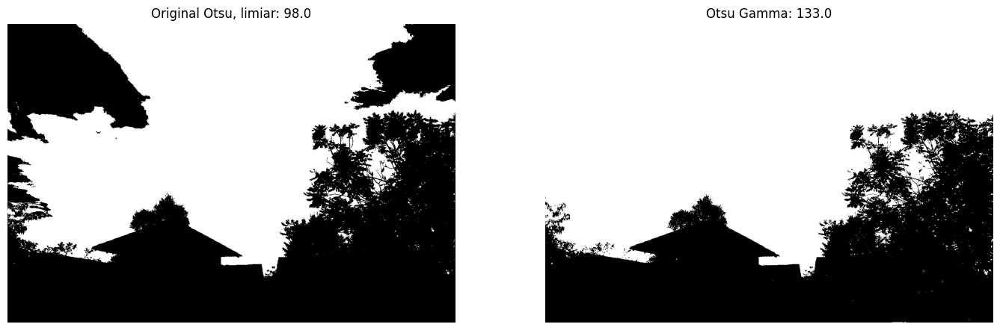

In [19]:
otsu(imgs_list_numpy[1][1], img_gamma_gray_pai)

## Conclusão:
*

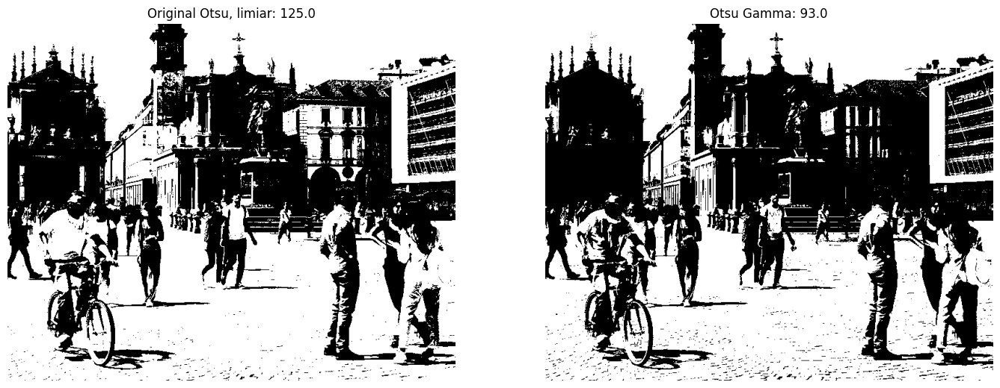

In [20]:
otsu(imgs_list_numpy[2][1], img_gamma_gray_ped02)

## Conclusão:
*

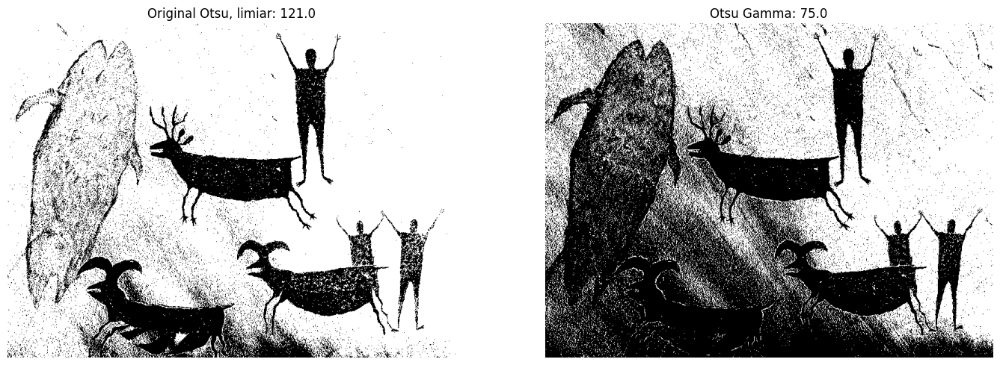

In [21]:
otsu(imgs_list_numpy[3][1], img_gamma_gray_pre01)

## Conclusão:
*

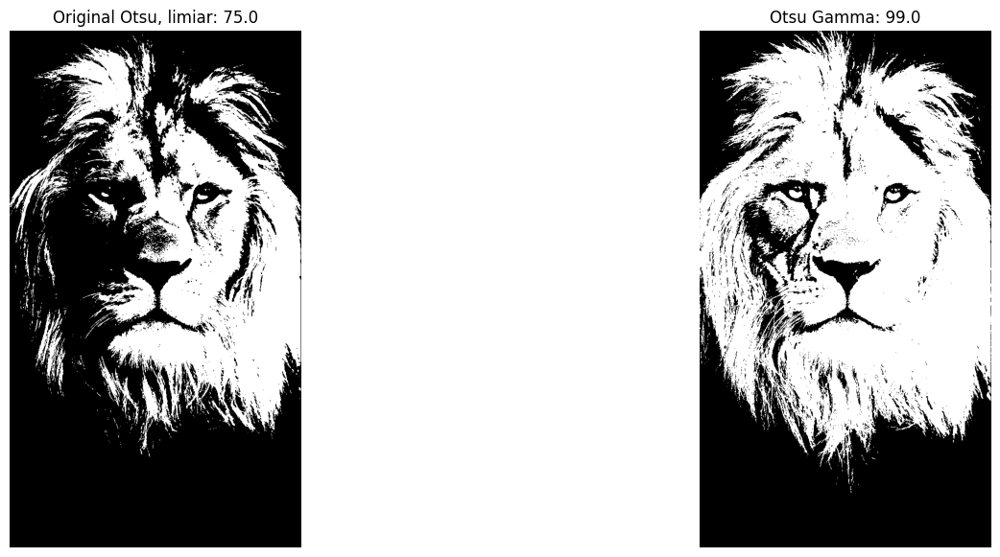

In [22]:
otsu(imgs_list_numpy[4][1], img_gamma_gray_leao)

## Conclusão:
*

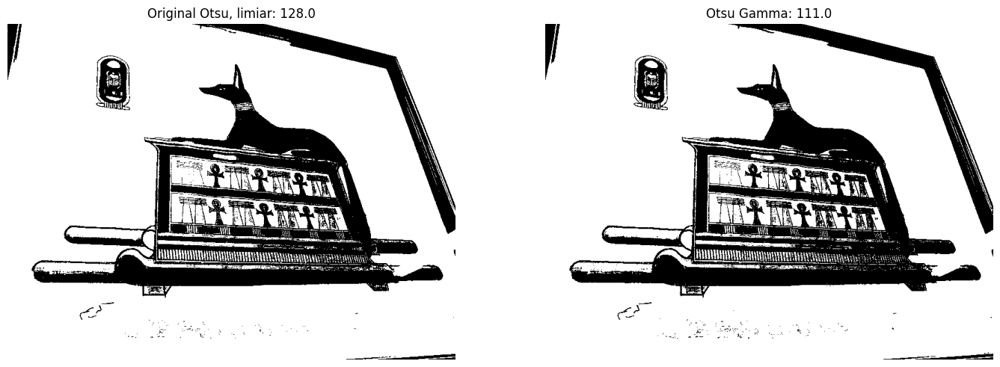

In [23]:
otsu(imgs_list_numpy[5][1], img_gamma_gray_pre02)

## Conclusão:
*

# Fatiamento da imagem em bits

In [ ]:
bit_0, bit_1, bit_2, bit_3, bit_4, bit_5, bit_6, bit_7 = split_img_bits(imgs_list[0])

## PSNR e SSIM dos 4 bits msb e lsb

In [ ]:
comparar_imgs(bit_0+bit_1+bit_2+bit_3, bit_4+bit_5+bit_6+bit_7)

## Conclusão:
*

In [ ]:
bit_0, bit_1, bit_2, bit_3, bit_4, bit_5, bit_6, bit_7 = split_img_bits(imgs_list[1])

## PSNR e SSIM dos 4 bits msb e lsb

In [ ]:
comparar_imgs(bit_0+bit_1+bit_2+bit_3, bit_4+bit_5+bit_6+bit_7)

## Conclusão:
*

In [ ]:
bit_0, bit_1, bit_2, bit_3, bit_4, bit_5, bit_6, bit_7 = split_img_bits(imgs_list[2])

## PSNR e SSIM dos 4 bits msb e lsb

In [ ]:
comparar_imgs(bit_0+bit_1+bit_2+bit_3, bit_4+bit_5+bit_6+bit_7)

## Conclusão:
*

In [ ]:
bit_0, bit_1, bit_2, bit_3, bit_4, bit_5, bit_6, bit_7 = split_img_bits(imgs_list[3])

## PSNR e SSIM dos 4 bits msb e lsb

In [ ]:
comparar_imgs(bit_0+bit_1+bit_2+bit_3, bit_4+bit_5+bit_6+bit_7)

## Conclusão:
*

In [ ]:
bit_0, bit_1, bit_2, bit_3, bit_4, bit_5, bit_6, bit_7 = split_img_bits(imgs_list[4])

## PSNR e SSIM dos 4 bits msb e lsb

In [ ]:
comparar_imgs(bit_0+bit_1+bit_2+bit_3, bit_4+bit_5+bit_6+bit_7)

## Conclusão:
*

In [ ]:
bit_0, bit_1, bit_2, bit_3, bit_4, bit_5, bit_6, bit_7 = split_img_bits(imgs_list[5])

## PSNR e SSIM dos 4 bits msb e lsb

In [ ]:
comparar_imgs(bit_0+bit_1+bit_2+bit_3, bit_4+bit_5+bit_6+bit_7)

## Conclusão:
*